## SAM

### **Segment Anything Model (El SAM de Meta)**


---

Lanzado por Meta AI (FAIR) en 2023, este es el "momento GPT" para la visión artificial. Es un modelo diseñado para la segmentación de imágenes: la tarea de identificar exactamente qué píxeles pertenecen a un objeto.

### **Enlace MetaAI:**
https://ai.meta.com/research/sam2/#demo

---
**Importante**
: Puede identificar y recortar objetos que nunca vio durante su entrenamiento.

In [1]:
pip install opencv-python segment-anything

In [2]:
!pip uninstall -y tensorflow transformers tf-keras
!pip install -U "tensorflow==2.19.*" "tf-keras==2.19.*" "transformers==4.44.2" datasets evaluate

Found existing installation: tensorflow 2.19.1
Uninstalling tensorflow-2.19.1:
  Successfully uninstalled tensorflow-2.19.1
Found existing installation: transformers 4.44.2
Uninstalling transformers-4.44.2:
  Successfully uninstalled transformers-4.44.2
Found existing installation: tf_keras 2.19.0
Uninstalling tf_keras-2.19.0:
  Successfully uninstalled tf_keras-2.19.0
  Using cached tensorflow-2.19.1-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.1 kB)
  Using cached tf_keras-2.19.0-py3-none-any.whl.metadata (1.8 kB)
  Using cached transformers-4.44.2-py3-none-any.whl.metadata (43 kB)
Using cached tensorflow-2.19.1-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (645.0 MB)
Using cached tf_keras-2.19.0-py3-none-any.whl (1.7 MB)
Using cached transformers-4.44.2-py3-none-any.whl (9.5 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conf

In [3]:
import requests
from google.colab import drive
drive.mount('/content/drive')

url = "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth"
checkpoint_path = "sam_vit_b.pth"

print("Downloading SAM checkpoint (may take a few minutes)...")
with open(checkpoint_path, "wb") as f:
    f.write(requests.get(url).content)

print("Download complete.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Download complete.


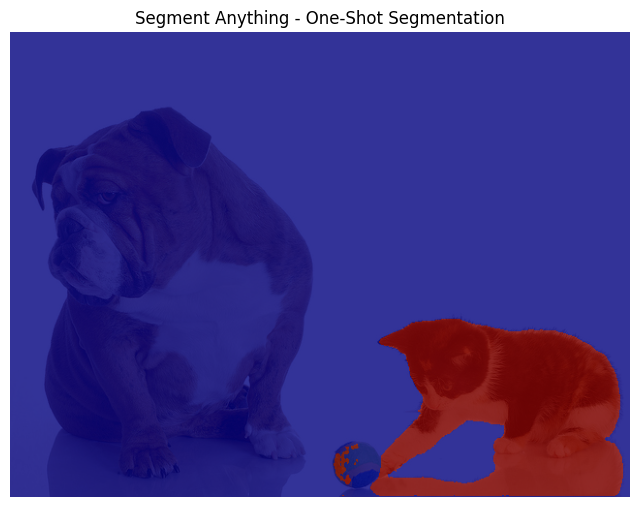

In [4]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from segment_anything import sam_model_registry, SamPredictor

# --- Load image ---
#image_path = "example_image.jpg"
image_path = "/content/drive/MyDrive/Inteligencia Artificial UNAL/Sistemas Inteligentes/Practica/Semana 5/COCO2.jpg"
#image_path = "COCO1.jpg"# Replace with your own image
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# --- Load SAM Model (ViT-H, ViT-B or ViT-L) ---
#El modelo se descargó en mi drive y se utilizo además tiene el nombre "sam_vit_b.pth"
sam_checkpoint = "sam_vit_b.pth"  # Download from: https://github.com/facebookresearch/segment-anything#model-checkpoints
model_type = "vit_b"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)
predictor.set_image(image_rgb)

# --- Define one-shot bounding box manually or from detection ---
# Format: [x_min, y_min, x_max, y_max]
input_box = np.array([[320, 240, 640, 480]])  # Example box (edit as needed)

# --- Run SAM Prediction ---
masks, scores, logits = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box,
    multimask_output=True,
)

# --- Visualize the best mask ---
best_mask = masks[np.argmax(scores)]

plt.figure(figsize=(8, 8))
plt.imshow(image_rgb)
plt.imshow(best_mask, alpha=0.8, cmap="jet")
plt.title("Segment Anything - One-Shot Segmentation")
plt.axis("off")
plt.show()


## Owl-ViT + SAM

### **Open-World Object Detector with Vision Transformers**

---

Fue desarrollado por Google Research y su nombre significa Open-World Object Detector with Vision Transformers.

Owl-ViT utiliza una arquitectura llamada Vision Transformer (ViT) y se basa en los conocimientos de CLIP (un modelo que entiende la relación entre imágenes y texto).

---
### **Enlace Owl-ViT:**

https://huggingface-co.translate.goog/docs/transformers/model_doc/owlvit?_x_tr_sl=en&_x_tr_tl=es&_x_tr_hl=es&_x_tr_pto=tc

---
**Importante**

* Entrada de Texto: Tú le das una frase (ej: "una taza de café azul").

* Entrada de Imagen: Le pasas la foto.

* Comparación: El modelo escanea la imagen buscando regiones que "coincidan" semánticamente con tu descripción de texto.

* Resultado: Dibuja un cuadro (cuadro delimitador) alrededor de lo que encontró.


In [1]:
!pip install opencv-python segment-anything

In [12]:
!pip uninstall -y tensorflow transformers tf-keras
!pip install -U "tensorflow==2.19.*" "tf-keras==2.19.*" "transformers==4.44.2" datasets evaluate

Found existing installation: tensorflow 2.19.0
Uninstalling tensorflow-2.19.0:
  Successfully uninstalled tensorflow-2.19.0
Found existing installation: transformers 5.0.0
Uninstalling transformers-5.0.0:
  Successfully uninstalled transformers-5.0.0
Found existing installation: tf_keras 2.19.0
Uninstalling tf_keras-2.19.0:
  Successfully uninstalled tf_keras-2.19.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.0/645.0 MB 825.2 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 55.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 52.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.5/527.5 kB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 566.4/566.4 kB 43.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.6/47.6 MB 16.4 MB/s eta 0:00:

In [2]:
import requests
from google.colab import drive
drive.mount('/content/drive')

url = "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth"
checkpoint_path = "sam_vit_b.pth"

print("Downloading SAM checkpoint (may take a few minutes)...")
with open(checkpoint_path, "wb") as f:
    f.write(requests.get(url).content)

print("Download complete.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Download complete.


In [3]:

import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from transformers import OwlViTProcessor, OwlViTForObjectDetection
from segment_anything import sam_model_registry, SamPredictor

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

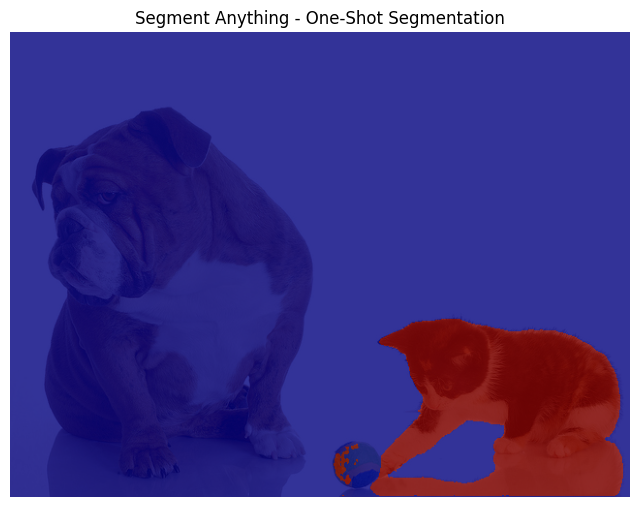

In [5]:

# --- Load image ---
#image_path = "example_image.jpg"
image_path = "/content/drive/MyDrive/Inteligencia Artificial UNAL/Sistemas Inteligentes/Practica/Semana 5/COCO2.jpg"
#image_path = "COCO1.jpg"# Replace with your own image
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# --- Load SAM Model (ViT-H, ViT-B or ViT-L) ---
sam_checkpoint = "sam_vit_b.pth"  # Download from: https://github.com/facebookresearch/segment-anything#model-checkpoints
model_type = "vit_b"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)
predictor.set_image(image_rgb)

# --- Define one-shot bounding box manually or from detection ---
# Format: [x_min, y_min, x_max, y_max]
input_box = np.array([[320, 240, 640, 480]])  # Example box (edit as needed)

# --- Run SAM Prediction ---
masks, scores, logits = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box,
    multimask_output=True,
)

# --- Visualize the best mask ---
best_mask = masks[np.argmax(scores)]

plt.figure(figsize=(8, 8))
plt.imshow(image_rgb)
plt.imshow(best_mask, alpha=0.8, cmap="jet")
plt.title("Segment Anything - One-Shot Segmentation")
plt.axis("off")
plt.show()

OWL-ViT detected 1 objects for prompt: a ball


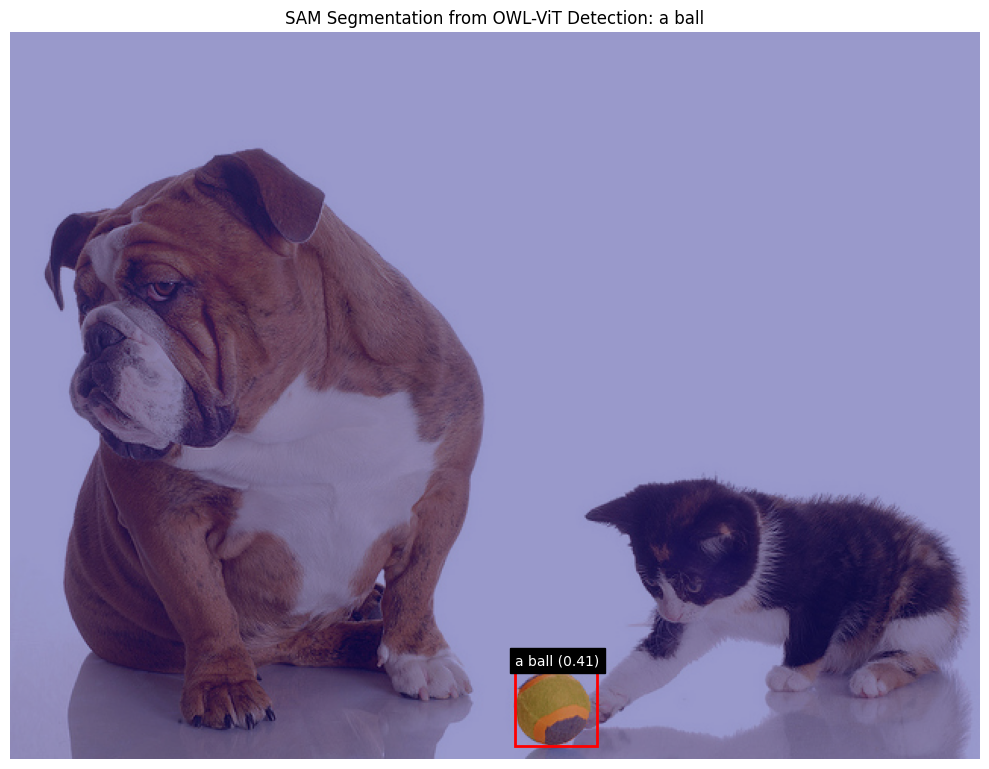

In [9]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from transformers import OwlViTProcessor, OwlViTForObjectDetection
from segment_anything import sam_model_registry, SamPredictor

# --- Load image ---
image_path = "/content/drive/MyDrive/Inteligencia Artificial UNAL/Sistemas Inteligentes/Practica/Semana 5/COCO2.jpg"  # Replace with your image path
image_bgr = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image_rgb)

# --- TEXT PROMPT ---
prompt = [["a cat"]]  # Change as needed
prompt = [["a ball"]]  # Change as needed


# --- OWL-ViT: detect bounding boxes from text prompt ---
processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
owlvit = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")

inputs = processor(text=prompt, images=image_pil, return_tensors="pt")
with torch.no_grad():
    outputs = owlvit(**inputs)

target_size = torch.tensor([image_pil.size[::-1]])  # (height, width)
results = processor.post_process_object_detection(outputs=outputs, target_sizes=target_size, threshold=0.4)[0]

boxes = results["boxes"]
scores = results["scores"]
labels = results["labels"]

print(f"OWL-ViT detected {len(boxes)} objects for prompt: {prompt[0][0]}")

# --- Load SAM model ---
sam_checkpoint = "sam_vit_b.pth"  # Downloaded checkpoint
sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)
predictor.set_image(image_rgb)

# --- Run SAM on each bounding box ---
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
ax = plt.gca()

for i, box in enumerate(boxes):
    box_np = box.numpy().astype(np.int32)
    x0, y0, x1, y1 = box_np
    input_box = np.array([box_np])  # shape: (1, 4)

    masks, scores_sam, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box,
        multimask_output=True
    )

    best_mask = masks[np.argmax(scores_sam)]
    ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='red', facecolor='none', linewidth=2))
    ax.imshow(best_mask, alpha=0.4, cmap='jet')

    ax.text(x0, y0 - 5, f"{prompt[0][labels[i]]} ({scores[i]:.2f})", color="white", backgroundcolor="black")

plt.axis("off")
plt.title(f"SAM Segmentation from OWL-ViT Detection: {prompt[0][0]}")
plt.tight_layout()
plt.show()


## Actividades

* Implementa el código para guardar la imagen de segmentación resultante.

* Cambia la imagen, el prompt del objeto y el umbral, y observa los resultados.

* Realiza la segmentación con una imagen de COCO de Internet y comenta los resultados.

* Realiza la segmentación, pero esta vez con un tipo de imagen más inusual (poco común), y comenta los resultados.

* Realiza la segmentación con un prompt más largo y comenta el resultado.

* Realiza la segmentación con un prompt en español y comenta el resultado.

* Implementa los siguientes scripts y describe qué hace cada uno.
  

### Punto **N°1**
* Implementa el código para guardar la imagen de segmentación resultante.

In [10]:
import matplotlib.pyplot as plt
import numpy as np

def save_owlvit_sam_result(image_rgb, boxes, masks_list, scores, labels, prompt, filename):
    plt.figure(figsize=(10,10))
    plt.imshow(image_rgb)
    ax = plt.gca()

    for i, box in enumerate(boxes):
        x0, y0, x1, y1 = box.numpy().astype(int)

        # bounding box
        ax.add_patch(
            plt.Rectangle((x0, y0), x1-x0, y1-y0,
            edgecolor="red", facecolor="none", linewidth=2)
        )

        # máscara SAM
        mask = masks_list[i]
        ax.imshow(mask, alpha=0.4, cmap="jet")

        # label
        ax.text(
            x0, y0-5,
            f"{prompt[0][labels[i]]} ({scores[i]:.2f})",
            color="white",
            backgroundcolor="black"
        )

    plt.axis("off")
    plt.tight_layout()
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.close()

In [11]:
masks_list = []

for i, box in enumerate(boxes):
    box_np = box.numpy().astype(np.int32)
    x0, y0, x1, y1 = box_np
    input_box = np.array([box_np])

    masks, scores_sam, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box,
        multimask_output=True
    )

    best_mask = masks[np.argmax(scores_sam)]
    masks_list.append(best_mask)

In [12]:
save_owlvit_sam_result(
    image_rgb,
    boxes,
    masks_list,
    scores,
    labels,
    prompt,
    "/content/drive/MyDrive/Inteligencia Artificial UNAL/Sistemas Inteligentes/Practica/Semana 5/otis2.jpg" #Este es el prompt que se le da para realizar la busqueda de la informacion en la imagen.
)

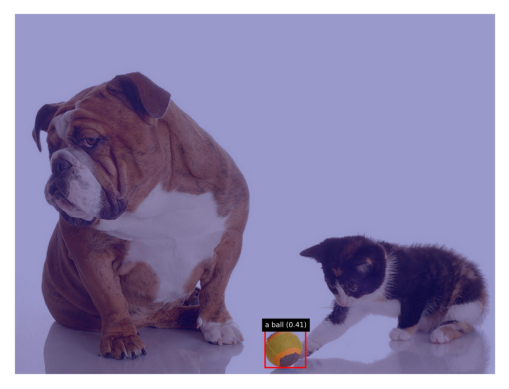

In [13]:
image_path = "/content/drive/MyDrive/Inteligencia Artificial UNAL/Sistemas Inteligentes/Practica/Semana 5/otis2.jpg" #Esta es la ruta que se utiliza para buscar la imagen y luego procesarla.

image_bgr = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image_rgb)

plt.imshow(image_pil)
plt.axis("off")
plt.show()

### Punto **N°2**
* Cambia la imagen, el prompt del objeto y el umbral, y observa los resultados.
---
**R// Se utilizó esta imagen con el fin de confundir al modelo: a la izquierda hay un gato y a la derecha un perro. Se bajó el valor del umbral (threshold) a 0.11 para no sesgar tanto al modelo; este logró identificar cuál era el perro, sin embargo, por más que se bajó, los clasificó a ambos como perros**

In [14]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


OWL-ViT detected 2 objects for prompt: a dog


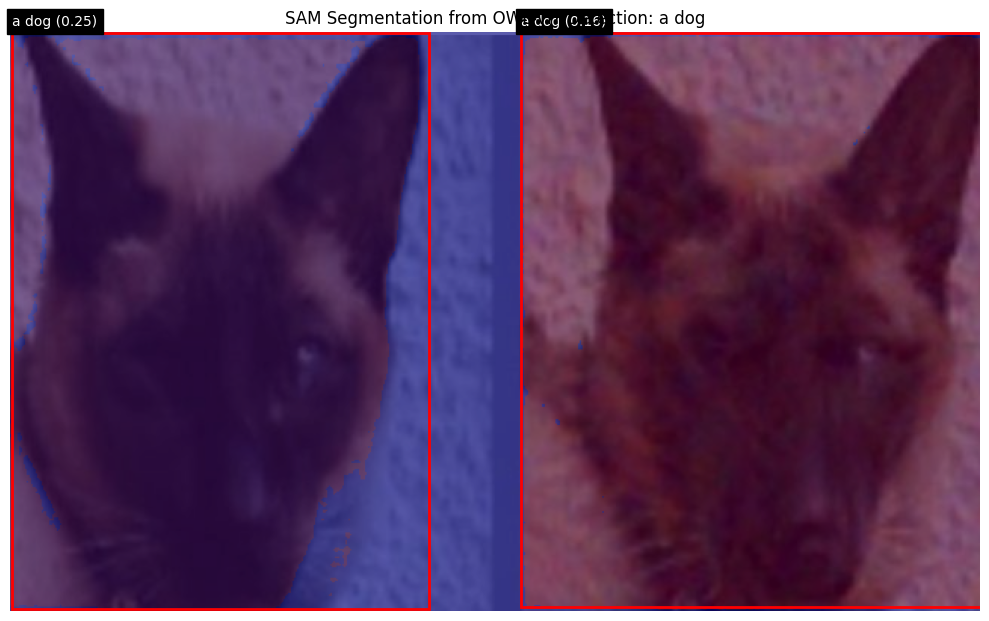

In [43]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from transformers import OwlViTProcessor, OwlViTForObjectDetection
from segment_anything import sam_model_registry, SamPredictor

# --- Load image ---
image_path = "/content/drive/MyDrive/Inteligencia Artificial UNAL/Sistemas Inteligentes/Practica/Semana 5/gato_perro.jpg"  # Replace with your image path
image_bgr = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image_rgb)

# --- TEXT PROMPT ---
prompt = [["a dog"]]  # Change as needed

# --- OWL-ViT: detect bounding boxes from text prompt ---
processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
owlvit = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")

inputs = processor(text=prompt, images=image_pil, return_tensors="pt")
with torch.no_grad():
    outputs = owlvit(**inputs)

target_size = torch.tensor([image_pil.size[::-1]])  # (height, width)
results = processor.post_process_object_detection(outputs=outputs, target_sizes=target_size, threshold=0.11)[0]

boxes = results["boxes"]
scores = results["scores"]
labels = results["labels"]

print(f"OWL-ViT detected {len(boxes)} objects for prompt: {prompt[0][0]}")

# --- Load SAM model ---
sam_checkpoint = "sam_vit_b.pth"  # Downloaded checkpoint
sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)
predictor.set_image(image_rgb)

# --- Run SAM on each bounding box ---
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
ax = plt.gca()

for i, box in enumerate(boxes):
    box_np = box.numpy().astype(np.int32)
    x0, y0, x1, y1 = box_np
    input_box = np.array([box_np])  # shape: (1, 4)

    masks, scores_sam, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box,
        multimask_output=True
    )

    best_mask = masks[np.argmax(scores_sam)]
    ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='red', facecolor='none', linewidth=2))
    ax.imshow(best_mask, alpha=0.4, cmap='jet')

    ax.text(x0, y0 - 5, f"{prompt[0][labels[i]]} ({scores[i]:.2f})", color="white", backgroundcolor="black")

plt.axis("off")
plt.title(f"SAM Segmentation from OWL-ViT Detection: {prompt[0][0]}")
plt.tight_layout()
plt.show()

### Punto **N°2.1** - **Imagenes nuevas para confundir al modelo**

---


OWL-ViT detected 1 objects for prompt: a dog


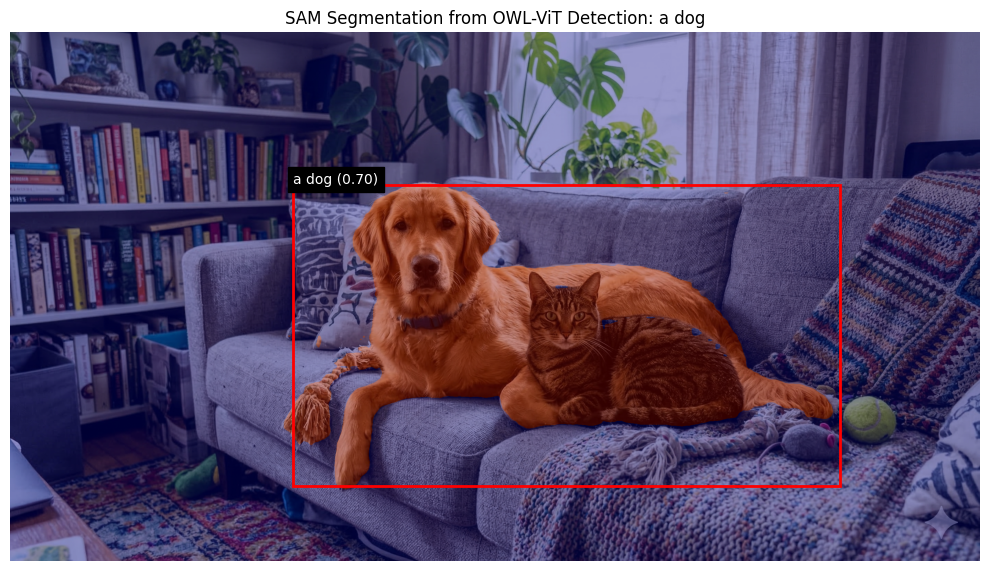

In [17]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from transformers import OwlViTProcessor, OwlViTForObjectDetection
from segment_anything import sam_model_registry, SamPredictor

# --- Load image ---
image_path = "/content/drive/MyDrive/Inteligencia Artificial UNAL/Sistemas Inteligentes/Practica/Semana 5/dog.jpg"  # Replace with your image path
image_bgr = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image_rgb)

# --- TEXT PROMPT ---
prompt = [["a dog"]]  # Change as needed

# --- OWL-ViT: detect bounding boxes from text prompt ---
processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
owlvit = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")

inputs = processor(text=prompt, images=image_pil, return_tensors="pt")
with torch.no_grad():
    outputs = owlvit(**inputs)

target_size = torch.tensor([image_pil.size[::-1]])  # (height, width)
results = processor.post_process_object_detection(outputs=outputs, target_sizes=target_size, threshold=0.3)[0]

boxes = results["boxes"]
scores = results["scores"]
labels = results["labels"]

print(f"OWL-ViT detected {len(boxes)} objects for prompt: {prompt[0][0]}")

# --- Load SAM model ---
sam_checkpoint = "sam_vit_b.pth"  # Downloaded checkpoint
sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)
predictor.set_image(image_rgb)

# --- Run SAM on each bounding box ---
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
ax = plt.gca()

for i, box in enumerate(boxes):
    box_np = box.numpy().astype(np.int32)
    x0, y0, x1, y1 = box_np
    input_box = np.array([box_np])  # shape: (1, 4)

    masks, scores_sam, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box,
        multimask_output=True
    )

    best_mask = masks[np.argmax(scores_sam)]
    ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='red', facecolor='none', linewidth=2))
    ax.imshow(best_mask, alpha=0.4, cmap='jet')

    ax.text(x0, y0 - 5, f"{prompt[0][labels[i]]} ({scores[i]:.2f})", color="white", backgroundcolor="black")

plt.axis("off")
plt.title(f"SAM Segmentation from OWL-ViT Detection: {prompt[0][0]}")
plt.tight_layout()
plt.show()

**Imagenes nuevas para confundir al modelo**

Se buscó evaluar la capacidad de generalización y la robustez del modelo frente a estímulos visuales engañosos (mimetismo). Para esto, se comparó la detección en una imagen real frente a una imagen compuesta por objetos inanimados que imitan formas orgánicas.

* **Resultados obtenidos:**

1. **Imagen Real (Perro y Gato):** El modelo identificó correctamente al perro con un nivel de confianza (**score**) de **0.70**.
2. **Imagen de Mimetismo (Cobijas/Mantas):** Al utilizar mantas que imitaban la silueta de las mascotas, el modelo mostró dudas significativas, otorgando una confianza de apenas **0.13** para la etiqueta *dog*.

* **Análisis del Umbral (Threshold):**
En ambos casos, se configuró un `threshold = 0.11`. Se optó por este valor tan bajo para forzar al modelo a generar una respuesta y observar qué tan cerca estaba de reconocer el patrón visual en las mantas.

> **Conclusión:** El experimento demuestra que, aunque el modelo detecta la estructura física, el mimetismo visual reduce drásticamente la confianza de la predicción, validando la efectividad de la imagen para confundir al sistema de visión.

OWL-ViT detected 1 objects for prompt: a dog


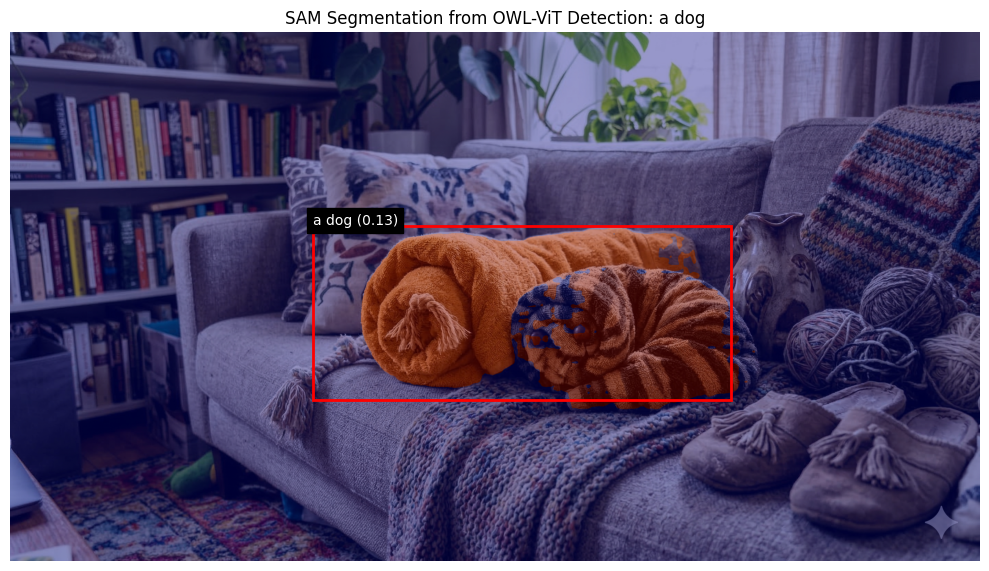

In [42]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from transformers import OwlViTProcessor, OwlViTForObjectDetection
from segment_anything import sam_model_registry, SamPredictor

# --- Load image ---
image_path = "/content/drive/MyDrive/Inteligencia Artificial UNAL/Sistemas Inteligentes/Practica/Semana 5/dog_2.jpg"  # Replace with your image path
image_bgr = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image_rgb)

# --- TEXT PROMPT ---
prompt = [["a dog"]]  # Change as needed

# --- OWL-ViT: detect bounding boxes from text prompt ---
processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
owlvit = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")

inputs = processor(text=prompt, images=image_pil, return_tensors="pt")
with torch.no_grad():
    outputs = owlvit(**inputs)

target_size = torch.tensor([image_pil.size[::-1]])  # (height, width)
results = processor.post_process_object_detection(outputs=outputs, target_sizes=target_size, threshold=0.11)[0]

boxes = results["boxes"]
scores = results["scores"]
labels = results["labels"]

print(f"OWL-ViT detected {len(boxes)} objects for prompt: {prompt[0][0]}")

# --- Load SAM model ---
sam_checkpoint = "sam_vit_b.pth"  # Downloaded checkpoint
sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)
predictor.set_image(image_rgb)

# --- Run SAM on each bounding box ---
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
ax = plt.gca()

for i, box in enumerate(boxes):
    box_np = box.numpy().astype(np.int32)
    x0, y0, x1, y1 = box_np
    input_box = np.array([box_np])  # shape: (1, 4)

    masks, scores_sam, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box,
        multimask_output=True
    )

    best_mask = masks[np.argmax(scores_sam)]
    ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='red', facecolor='none', linewidth=2))
    ax.imshow(best_mask, alpha=0.4, cmap='jet')

    ax.text(x0, y0 - 5, f"{prompt[0][labels[i]]} ({scores[i]:.2f})", color="white", backgroundcolor="black")

plt.axis("off")
plt.title(f"SAM Segmentation from OWL-ViT Detection: {prompt[0][0]}")
plt.tight_layout()
plt.show()

### Punto **N°3**
* Realiza la segmentación con una imagen de COCO de Internet y comenta los resultados.
---

**R// Se realizó la segmentación de manera exitosa, además reconocí el objecto con un `score 0.51`**



OWL-ViT detected 1 objects for prompt: a ball


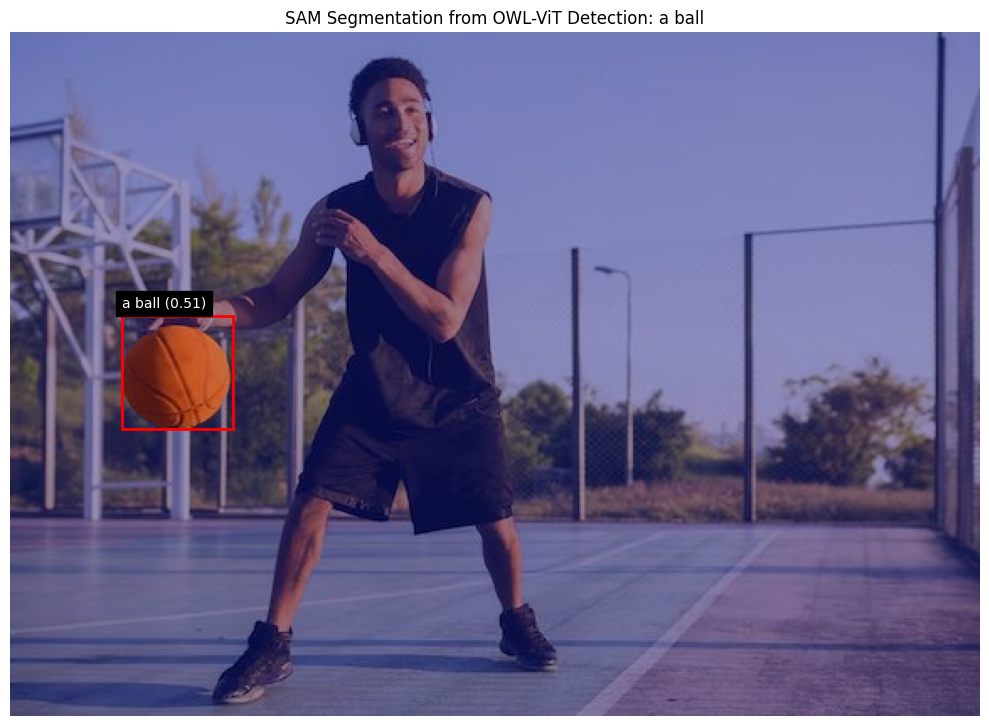

In [27]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from transformers import OwlViTProcessor, OwlViTForObjectDetection
from segment_anything import sam_model_registry, SamPredictor

# --- Load image ---
image_path = "/content/drive/MyDrive/Inteligencia Artificial UNAL/Sistemas Inteligentes/Practica/Semana 5/ball.JPG"  # Replace with your image path
image_bgr = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image_rgb)

# --- TEXT PROMPT ---
prompt = [["a ball"]]  # Change as needed
  # Change as needed


# --- OWL-ViT: detect bounding boxes from text prompt ---
processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
owlvit = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")

inputs = processor(text=prompt, images=image_pil, return_tensors="pt")
with torch.no_grad():
    outputs = owlvit(**inputs)

target_size = torch.tensor([image_pil.size[::-1]])  # (height, width)
results = processor.post_process_object_detection(outputs=outputs, target_sizes=target_size, threshold=0.4)[0]

boxes = results["boxes"]
scores = results["scores"]
labels = results["labels"]

print(f"OWL-ViT detected {len(boxes)} objects for prompt: {prompt[0][0]}")

# --- Load SAM model ---
sam_checkpoint = "sam_vit_b.pth"  # Downloaded checkpoint
sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)
predictor.set_image(image_rgb)

# --- Run SAM on each bounding box ---
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
ax = plt.gca()

for i, box in enumerate(boxes):
    box_np = box.numpy().astype(np.int32)
    x0, y0, x1, y1 = box_np
    input_box = np.array([box_np])  # shape: (1, 4)

    masks, scores_sam, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box,
        multimask_output=True
    )

    best_mask = masks[np.argmax(scores_sam)]
    ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='red', facecolor='none', linewidth=2))
    ax.imshow(best_mask, alpha=0.4, cmap='jet')

    ax.text(x0, y0 - 5, f"{prompt[0][labels[i]]} ({scores[i]:.2f})", color="white", backgroundcolor="black")

plt.axis("off")
plt.title(f"SAM Segmentation from OWL-ViT Detection: {prompt[0][0]}")
plt.tight_layout()
plt.show()


### Punto **N°4**

* Realiza la segmentación, pero esta vez con un tipo de imagen más inusual (poco común), y comenta los resultados.

---

**R// Se utilizó una imagen con mucho ruido para saber el comportamiento del modelo, y se preguntó para que logrará reconocer el taxi y lo realizó la segmentación `score 0.45`**



OWL-ViT detected 2 objects for prompt: a taxi


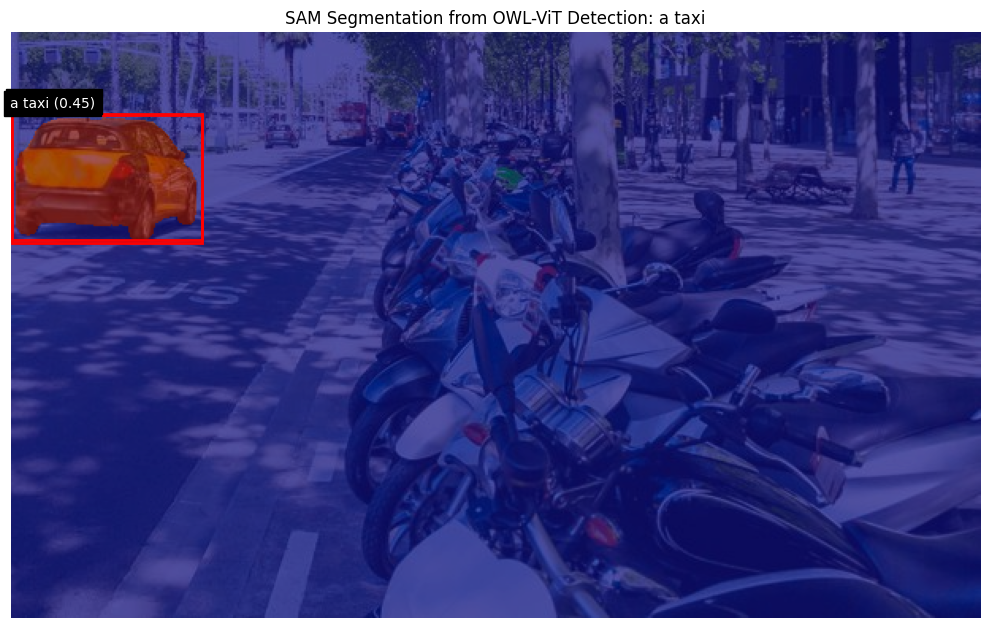

In [31]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from transformers import OwlViTProcessor, OwlViTForObjectDetection
from segment_anything import sam_model_registry, SamPredictor

# --- Load image ---
image_path = "/content/drive/MyDrive/Inteligencia Artificial UNAL/Sistemas Inteligentes/Practica/Semana 5/person.JPG"  # Replace with your image path
image_bgr = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image_rgb)

# --- TEXT PROMPT ---
prompt = [["a taxi"]]  # Change as needed

# --- OWL-ViT: detect bounding boxes from text prompt ---
processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
owlvit = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")

inputs = processor(text=prompt, images=image_pil, return_tensors="pt")
with torch.no_grad():
    outputs = owlvit(**inputs)

target_size = torch.tensor([image_pil.size[::-1]])  # (height, width)
results = processor.post_process_object_detection(outputs=outputs, target_sizes=target_size, threshold=0.3)[0]

boxes = results["boxes"]
scores = results["scores"]
labels = results["labels"]

print(f"OWL-ViT detected {len(boxes)} objects for prompt: {prompt[0][0]}")

# --- Load SAM model ---
sam_checkpoint = "sam_vit_b.pth"  # Downloaded checkpoint
sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)
predictor.set_image(image_rgb)

# --- Run SAM on each bounding box ---
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
ax = plt.gca()

for i, box in enumerate(boxes):
    box_np = box.numpy().astype(np.int32)
    x0, y0, x1, y1 = box_np
    input_box = np.array([box_np])  # shape: (1, 4)

    masks, scores_sam, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box,
        multimask_output=True
    )

    best_mask = masks[np.argmax(scores_sam)]
    ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='red', facecolor='none', linewidth=2))
    ax.imshow(best_mask, alpha=0.4, cmap='jet')

    ax.text(x0, y0 - 5, f"{prompt[0][labels[i]]} ({scores[i]:.2f})", color="white", backgroundcolor="black")

plt.axis("off")
plt.title(f"SAM Segmentation from OWL-ViT Detection: {prompt[0][0]}")
plt.tight_layout()
plt.show()

### Punto **N°5**
* Realiza la segmentación con un prompt más largo y comenta el resultado.
---
**R// Al realizar un prompt más largo le permitió al modelo tomar más informacion en la imagen, además se tuvo el siguiente `score 0.15` en la mayoria de lo que se clasificó.**

OWL-ViT detectó 4 objetos.


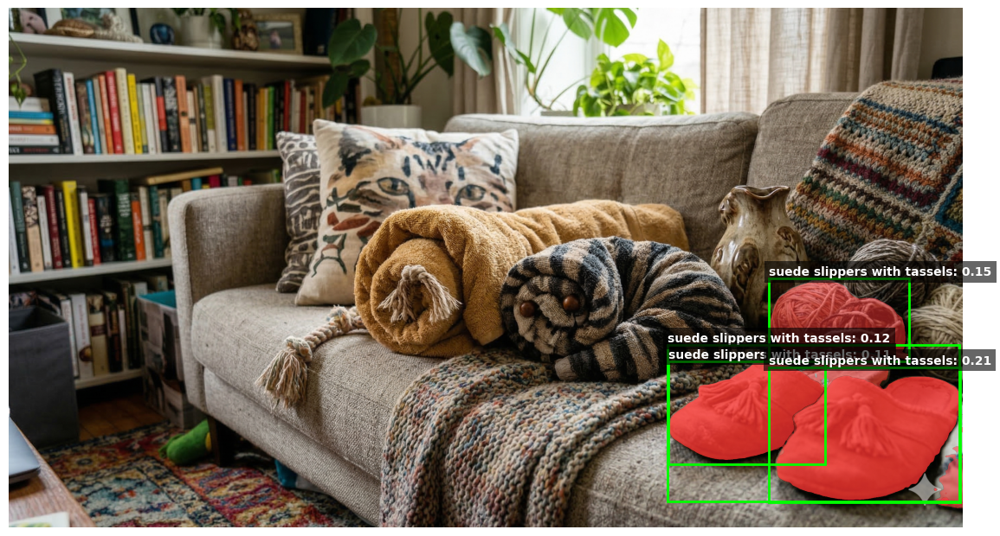

In [40]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from transformers import OwlViTProcessor, OwlViTForObjectDetection
from segment_anything import sam_model_registry, SamPredictor

# --- 1. CONFIGURACIÓN Y CARGA DE IMAGEN ---
# Cambia esta ruta por la de tu imagen (ej. la de las zapatillas y toallas)
image_path = "/content/drive/MyDrive/Inteligencia Artificial UNAL/Sistemas Inteligentes/Practica/Semana 5/dog_2.jpg"
image_bgr = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image_rgb)

# --- 2. OWL-ViT: DETECCIÓN ---
# Definimos los prompts (puedes poner varios)
text_queries = ["suede slippers with tassels", "striped rolled towel", "mustard blanket"]
prompt = [text_queries]

processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
owlvit = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")

inputs = processor(text=prompt, images=image_pil, return_tensors="pt")
with torch.no_grad():
    outputs = owlvit(**inputs)

# Post-procesamiento: bajamos el threshold a 0.15 para no perder detecciones
target_size = torch.tensor([image_pil.size[::-1]])
results = processor.post_process_object_detection(outputs=outputs, target_sizes=target_size, threshold=0.11)[0]

boxes = results["boxes"]
scores = results["scores"]
labels = results["labels"]

print(f"OWL-ViT detectó {len(boxes)} objetos.")

# --- 3. SAM: SEGMENTACIÓN ---
sam_checkpoint = "sam_vit_b.pth"  # Asegúrate de que el archivo esté en tu carpeta
sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)
predictor.set_image(image_rgb)

# --- 4. VISUALIZACIÓN FINAL ---
plt.figure(figsize=(12, 12))
plt.imshow(image_rgb)
ax = plt.gca()

if len(boxes) == 0:
    print("No se detectaron objetos. Intenta bajar más el threshold o cambiar el prompt.")
else:
    for i, box in enumerate(boxes):
        # Preparar la caja para SAM [x0, y0, x1, y1]
        box_np = box.detach().cpu().numpy()
        x0, y0, x1, y1 = box_np.astype(np.int32)

        # Ejecutar SAM sobre la caja detectada
        masks, scores_sam, _ = predictor.predict(
            point_coords=None,
            point_labels=None,
            box=box_np[None, :], # Formato (1, 4) requerido
            multimask_output=True
        )

        # Seleccionamos la máscara con mayor score de SAM
        best_mask = masks[np.argmax(scores_sam)]

        # --- Dibujar resultados ---
        # Máscara de color (Rojo con 50% de transparencia)
        color = np.array([255/255, 50/255, 50/255, 0.5])
        h, w = best_mask.shape[-2:]
        mask_image = best_mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
        ax.imshow(mask_image)

        # Bounding Box
        ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='lime', facecolor='none', linewidth=2))

        # Texto con el nombre del prompt detectado
        label_id = labels[i].item()
        label_text = text_queries[label_id]
        ax.text(x0, y0 - 10, f"{label_text}: {scores[i]:.2f}",
                color="white", fontsize=10, fontweight='bold',
                bbox=dict(facecolor='black', alpha=0.6, edgecolor='none'))

plt.axis("off")
plt.tight_layout()
plt.show()

### Punto **N°6**
* Realiza la segmentación con un prompt en español y comenta el resultado.
---
**Observación:** Al utilizar un prompt en español (ej."cabija encima del sofa"), el modelo no generó ninguna detección.
* **R//** Esto se debe a que el modelo base (**OWL-ViT**) fue pre-entrenado con un dataset cuyo corpus de texto está exclusivamente en **inglés**. Por lo tanto, no posee la capacidad de mapear conceptos semánticos en español hacia las características visuales de la imagen, resultando en una falta de respuesta.

OWL-ViT detectó 0 objetos.
No se detectaron objetos. Intenta bajar más el threshold o cambiar el prompt.


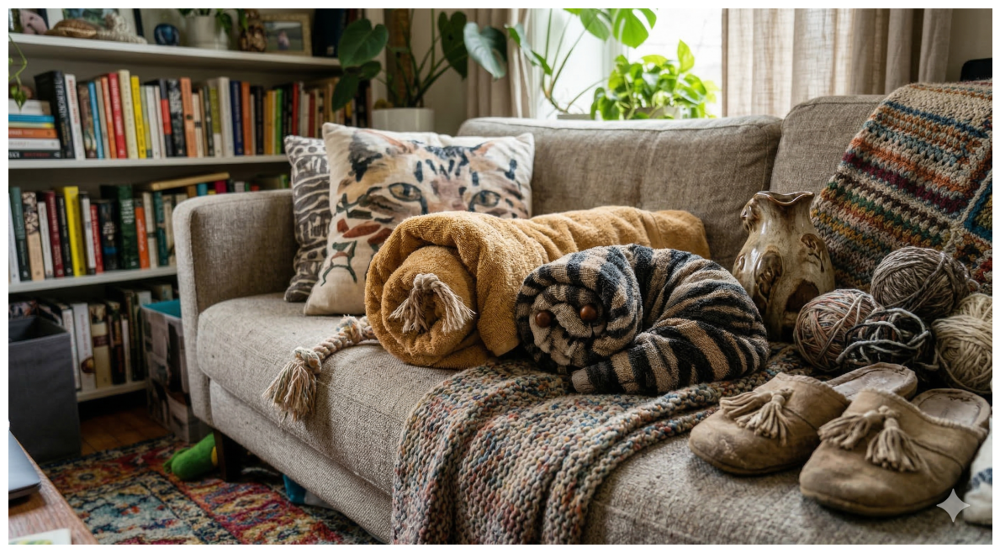

In [41]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from transformers import OwlViTProcessor, OwlViTForObjectDetection
from segment_anything import sam_model_registry, SamPredictor

# --- 1. CONFIGURACIÓN Y CARGA DE IMAGEN ---
# Cambia esta ruta por la de tu imagen (ej. la de las zapatillas y toallas)
image_path = "/content/drive/MyDrive/Inteligencia Artificial UNAL/Sistemas Inteligentes/Practica/Semana 5/dog_2.jpg"
image_bgr = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
image_pil = Image.fromarray(image_rgb)

# --- 2. OWL-ViT: DETECCIÓN ---
# Definimos los prompts (puedes poner varios)
text_queries = ["cabija encima del sofa"]
prompt = [text_queries]

processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
owlvit = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")

inputs = processor(text=prompt, images=image_pil, return_tensors="pt")
with torch.no_grad():
    outputs = owlvit(**inputs)

# Post-procesamiento: bajamos el threshold a 0.15 para no perder detecciones
target_size = torch.tensor([image_pil.size[::-1]])
results = processor.post_process_object_detection(outputs=outputs, target_sizes=target_size, threshold=0.11)[0]

boxes = results["boxes"]
scores = results["scores"]
labels = results["labels"]

print(f"OWL-ViT detectó {len(boxes)} objetos.")

# --- 3. SAM: SEGMENTACIÓN ---
sam_checkpoint = "sam_vit_b.pth"  # Asegúrate de que el archivo esté en tu carpeta
sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)
predictor.set_image(image_rgb)

# --- 4. VISUALIZACIÓN FINAL ---
plt.figure(figsize=(12, 12))
plt.imshow(image_rgb)
ax = plt.gca()

if len(boxes) == 0:
    print("No se detectaron objetos. Intenta bajar más el threshold o cambiar el prompt.")
else:
    for i, box in enumerate(boxes):
        # Preparar la caja para SAM [x0, y0, x1, y1]
        box_np = box.detach().cpu().numpy()
        x0, y0, x1, y1 = box_np.astype(np.int32)

        # Ejecutar SAM sobre la caja detectada
        masks, scores_sam, _ = predictor.predict(
            point_coords=None,
            point_labels=None,
            box=box_np[None, :], # Formato (1, 4) requerido
            multimask_output=True
        )

        # Seleccionamos la máscara con mayor score de SAM
        best_mask = masks[np.argmax(scores_sam)]

        # --- Dibujar resultados ---
        # Máscara de color (Rojo con 50% de transparencia)
        color = np.array([255/255, 50/255, 50/255, 0.5])
        h, w = best_mask.shape[-2:]
        mask_image = best_mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
        ax.imshow(mask_image)

        # Bounding Box
        ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='lime', facecolor='none', linewidth=2))

        # Texto con el nombre del prompt detectado
        label_id = labels[i].item()
        label_text = text_queries[label_id]
        ax.text(x0, y0 - 10, f"{label_text}: {scores[i]:.2f}",
                color="white", fontsize=10, fontweight='bold',
                bbox=dict(facecolor='black', alpha=0.6, edgecolor='none'))

plt.axis("off")
plt.tight_layout()
plt.show()

* Implementa los siguientes scripts y describe qué hace cada uno.
  

### Punto **N°7**

#### **1. Herramienta de Inspección de Coordenadas**
El primer script funciona como un **visor interactivo**. Su objetivo principal es permitir la exploración visual de la imagen (`image_rgb`) mediante el motor de renderizado de Matplotlib.
* **Funcionalidad:** Al mover el cursor sobre la imagen, el sistema rastrea la posición en tiempo real, mostrando las coordenadas $(x, y)$ en la barra de estado.
* **Utilidad:** Es fundamental para identificar puntos de interés específicos o "puntos positivos" que SAM requiere como *prompts* de entrada.



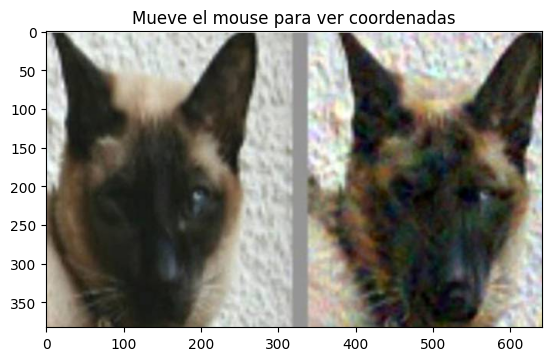

In [44]:
plt.figure()
plt.imshow(image_rgb)
plt.title("Mueve el mouse para ver coordenadas")
plt.show()
# Las coordenadas aparecen en la barra inferior de la ventana

#### **2. Generador de Bounding Boxes mediante Eventos de Clic**
El segundo script implementa un sistema de **captura de eventos de ratón** (`button_press_event`) para automatizar la creación de regiones de interés (ROI).
* **Mecanismo:** El usuario define el área de segmentación mediante dos clics estratégicos (esquina superior izquierda e inferior derecha).
* **Resultado** La función `onclick` procesa estos eventos y los formatea automáticamente en un **NumPy Array**. Este formato es exactamente el que espera el modelo SAM para recibir un `input_box`, facilitando la transición entre la selección manual y la generación de la máscara de segmentación.



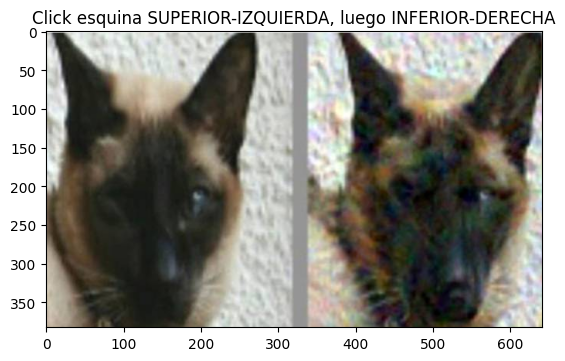

In [45]:
coords = []

def onclick(event):
    if event.xdata and event.ydata:
        coords.append((int(event.xdata), int(event.ydata)))
        print(f"Click {len(coords)}: x={int(event.xdata)}, y={int(event.ydata)}")
        if len(coords) == 2:
            print(f"\ninput_box = np.array([[{coords[0][0]}, {coords[0][1]}, {coords[1][0]}, {coords[1][1]}]])")

fig, ax = plt.subplots()
ax.imshow(image_rgb)
ax.set_title("Click esquina SUPERIOR-IZQUIERDA, luego INFERIOR-DERECHA")
fig.canvas.mpl_connect('button_press_event', onclick)
plt.show()